### Changes camparing to DCGAN:
1. Cancel sigmoid function in discriminator
2. WGAN weight clipping-- clip discriminator weights between -0.01, 0.01
3. G_loss, D_loss change according to WGAN criteria
4. Change optimizer from Adam to RMSProp


paper: [Wasserstein GAN](https://arxiv.org/abs/1701.07875)

## 1. Import dataset & data preprocess

See details in utils/data_preprocess.ipynb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/301_Final_proj/images2.zip -d /content/images


Streaming output truncated to the last 5000 lines.
  inflating: /content/images/crop_2020_img/927.jpg  
  inflating: /content/images/crop_2020_img/9270.jpg  
  inflating: /content/images/crop_2020_img/92700.jpg  
  inflating: /content/images/crop_2020_img/92701.jpg  
  inflating: /content/images/crop_2020_img/92702.jpg  
  inflating: /content/images/crop_2020_img/92703.jpg  
  inflating: /content/images/crop_2020_img/92704.jpg  
  inflating: /content/images/crop_2020_img/92705.jpg  
  inflating: /content/images/crop_2020_img/92706.jpg  
  inflating: /content/images/crop_2020_img/92707.jpg  
  inflating: /content/images/crop_2020_img/92708.jpg  
  inflating: /content/images/crop_2020_img/92709.jpg  
  inflating: /content/images/crop_2020_img/9271.jpg  
  inflating: /content/images/crop_2020_img/92710.jpg  
  inflating: /content/images/crop_2020_img/92711.jpg  
  inflating: /content/images/crop_2020_img/92712.jpg  
  inflating: /content/images/crop_2020_img/92713.jpg  
  inflating: /cont

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [ ]:
anime_data_dir = "/content/images"


In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    anime_data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # update from 32
)

Found 96889 files belonging to 1 classes.


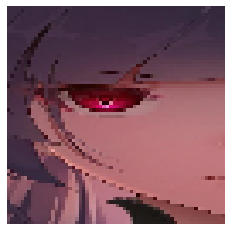

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i]) 
        plt.imshow(img)
        plt.axis('off') 
    plt.show()

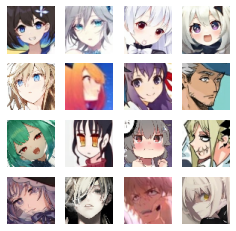

In [ ]:
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 128 
# weight initializer for G per DCGAN paper 
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3  

In [ ]:
def build_generator():
    # create a Keras Sequential model 
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4), 
                                     strides=(2, 2), 
                                     padding="same", 
                                     use_bias=False, 
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization()) # Margaret exp: add back bach norm
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator()

In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             4227072   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097152   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 256)      1024      
 ormalization)                                                   
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0 

In [ ]:
# UPDATE for WGAN: a new class implementing weight clipping constraint
class WeightClipping(tf.keras.constraints.Constraint):
    def __init__(self, clip_value):
        self.clip_value = clip_value
    
    def __call__(self, weights):
        return tf.clip_by_value(weights, -self.clip_value, self.clip_value)
    
    def get_config(self):
        return {'clip_value': self.clip_value}

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    #UPDATE for WGAN: enfoce 1-Lipschitz constraint with weight clippping to [-1, 1] 
    constraint = WeightClipping(0.01)

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint, # UPDATE for WGAN
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2), 
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization()) 
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4), padding="same", 
                            strides=(2, 2),
                            kernel_constraint = constraint,)) # UPDATE for WGAN
    # model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3)) 

    # UPDATE for WGAN: linear activation in the last layer. 
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3) 

In [ ]:
class WGAN(keras.Model):
    def __init__(self, 
                 critic, 
                 generator, 
                 latent_dim, 
                 critic_extra_steps): # UPDATE
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN: remove the code of real / fake labels
    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # UPDATE for WGAN: we train the critic more often than the generator by 5 times (self.c_extra_steps) 
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images 
            with tf.GradientTape() as tape:
                # Get the critic' predictions on the real images
                pred_real = self.critic(real_images, training=True)
                # Generate fake images from the latent noise
                fake_images = self.generator(noise, training=True) 
                # Get the critic' predictions on the fake images
                pred_fake = self.critic(fake_images, training=True)
                # Calculate the critic loss with wassertein loss function
                d_loss = self.d_loss_fn(pred_real, pred_fake)
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake) 
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator weights
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(4, 4))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('epoch_{:03d}.png'.format(epoch)) 
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan = WGAN(critic=critic, 
              generator=generator, 
              latent_dim=LATENT_DIM,
              critic_extra_steps=5) # UPDATE for WGAN

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.00005 # UPDATE for WGAN: learning rate per WGAN paper

In [ ]:
wgan.compile(
    d_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    g_optimizer = keras.optimizers.RMSprop(learning_rate=LR, clipvalue=1.0, decay=1e-8), # UPDATE for WGAN: use RMSProp instead of Adam
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/100
379/379 [==============================] - ETA: 0s - d_loss: -25.1717 - g_loss: 19.1331

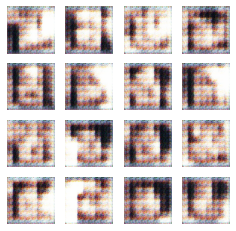

379/379 [==============================] - 78s 161ms/step - d_loss: -25.1717 - g_loss: 19.1331
Epoch 2/100
379/379 [==============================] - ETA: 0s - d_loss: -120.3334 - g_loss: 87.4259

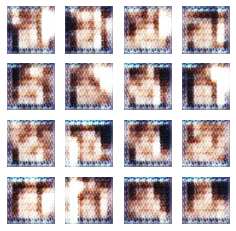

379/379 [==============================] - 61s 160ms/step - d_loss: -120.3334 - g_loss: 87.4259
Epoch 3/100
379/379 [==============================] - ETA: 0s - d_loss: -214.4512 - g_loss: 131.5170

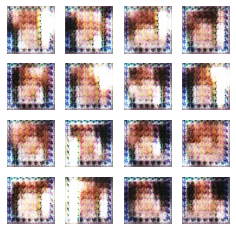

379/379 [==============================] - 61s 160ms/step - d_loss: -214.4512 - g_loss: 131.5170
Epoch 4/100
379/379 [==============================] - ETA: 0s - d_loss: -279.0400 - g_loss: 152.0261

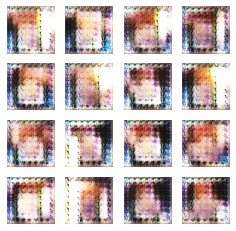

379/379 [==============================] - 61s 159ms/step - d_loss: -279.0400 - g_loss: 152.0261
Epoch 5/100
379/379 [==============================] - ETA: 0s - d_loss: -314.4483 - g_loss: 182.3492

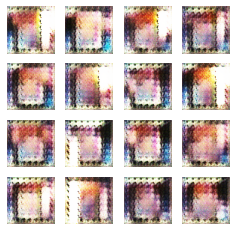

379/379 [==============================] - 61s 160ms/step - d_loss: -314.4483 - g_loss: 182.3492
Epoch 6/100
379/379 [==============================] - ETA: 0s - d_loss: -345.3833 - g_loss: 254.8636

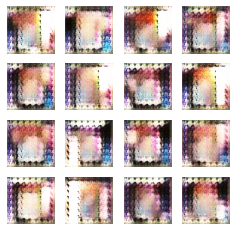

379/379 [==============================] - 61s 159ms/step - d_loss: -345.3833 - g_loss: 254.8636
Epoch 7/100
379/379 [==============================] - ETA: 0s - d_loss: -359.1276 - g_loss: 324.7194

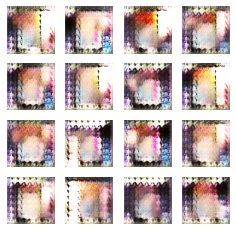

379/379 [==============================] - 61s 159ms/step - d_loss: -359.1276 - g_loss: 324.7194
Epoch 8/100
379/379 [==============================] - ETA: 0s - d_loss: -352.0979 - g_loss: 414.3432

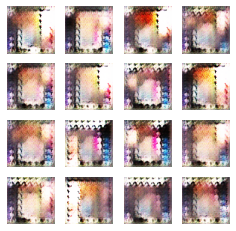

379/379 [==============================] - 61s 160ms/step - d_loss: -352.0979 - g_loss: 414.3432
Epoch 9/100
379/379 [==============================] - ETA: 0s - d_loss: -326.6275 - g_loss: 522.5081

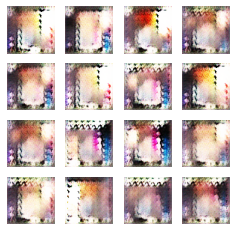

379/379 [==============================] - 61s 160ms/step - d_loss: -326.6275 - g_loss: 522.5081
Epoch 10/100
379/379 [==============================] - ETA: 0s - d_loss: -305.6168 - g_loss: 549.6016

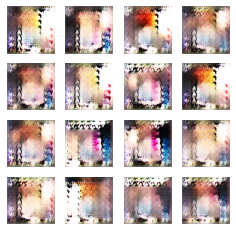

379/379 [==============================] - 61s 160ms/step - d_loss: -305.6168 - g_loss: 549.6016
Epoch 11/100
379/379 [==============================] - ETA: 0s - d_loss: -287.2551 - g_loss: 700.5932

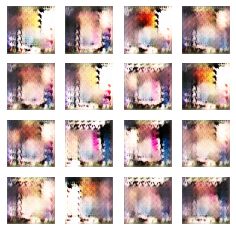

379/379 [==============================] - 61s 160ms/step - d_loss: -287.2551 - g_loss: 700.5932
Epoch 12/100
379/379 [==============================] - ETA: 0s - d_loss: -266.4824 - g_loss: 488.8516

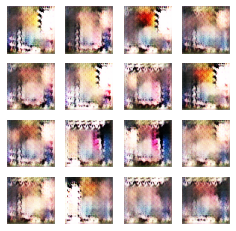

379/379 [==============================] - 61s 160ms/step - d_loss: -266.4824 - g_loss: 488.8516
Epoch 13/100
379/379 [==============================] - ETA: 0s - d_loss: -248.6675 - g_loss: 715.1701

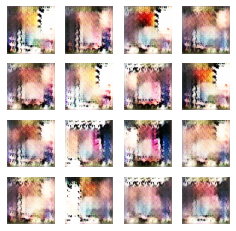

379/379 [==============================] - 61s 160ms/step - d_loss: -248.6675 - g_loss: 715.1701
Epoch 14/100
379/379 [==============================] - ETA: 0s - d_loss: -220.8909 - g_loss: 335.2387

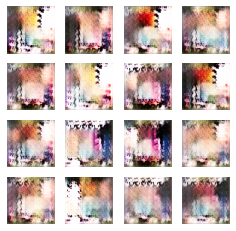

379/379 [==============================] - 61s 160ms/step - d_loss: -220.8909 - g_loss: 335.2387
Epoch 15/100
379/379 [==============================] - ETA: 0s - d_loss: -205.7662 - g_loss: 180.5962

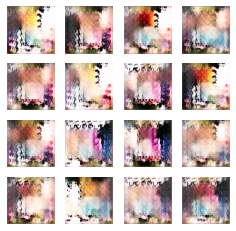

379/379 [==============================] - 61s 159ms/step - d_loss: -205.7662 - g_loss: 180.5962
Epoch 16/100
379/379 [==============================] - ETA: 0s - d_loss: -193.8308 - g_loss: 769.3969

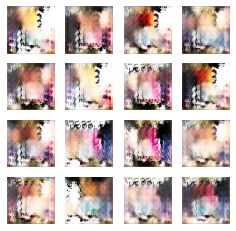

379/379 [==============================] - 61s 159ms/step - d_loss: -193.8308 - g_loss: 769.3969
Epoch 17/100
379/379 [==============================] - ETA: 0s - d_loss: -186.7487 - g_loss: 428.5329

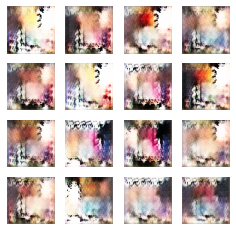

379/379 [==============================] - 61s 160ms/step - d_loss: -186.7487 - g_loss: 428.5329
Epoch 18/100
379/379 [==============================] - ETA: 0s - d_loss: -185.2622 - g_loss: 423.9302

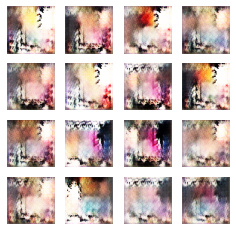

379/379 [==============================] - 61s 160ms/step - d_loss: -185.2622 - g_loss: 423.9302
Epoch 19/100
379/379 [==============================] - ETA: 0s - d_loss: -181.2119 - g_loss: 346.4122

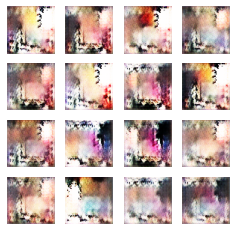

379/379 [==============================] - 61s 160ms/step - d_loss: -181.2119 - g_loss: 346.4122
Epoch 20/100
379/379 [==============================] - ETA: 0s - d_loss: -174.9174 - g_loss: -114.1710

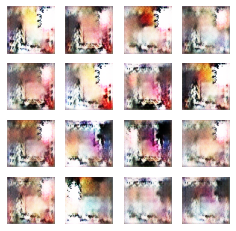

379/379 [==============================] - 61s 159ms/step - d_loss: -174.9174 - g_loss: -114.1710
Epoch 21/100
379/379 [==============================] - ETA: 0s - d_loss: -170.8979 - g_loss: 78.0491

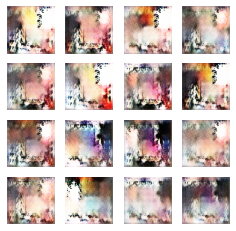

379/379 [==============================] - 61s 160ms/step - d_loss: -170.8979 - g_loss: 78.0491
Epoch 22/100
379/379 [==============================] - ETA: 0s - d_loss: -158.3302 - g_loss: 133.5966

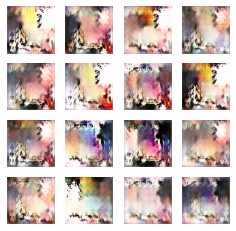

379/379 [==============================] - 61s 160ms/step - d_loss: -158.3302 - g_loss: 133.5966
Epoch 23/100
379/379 [==============================] - ETA: 0s - d_loss: -155.4274 - g_loss: 88.0985

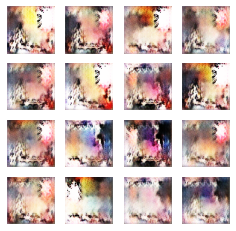

379/379 [==============================] - 61s 160ms/step - d_loss: -155.4274 - g_loss: 88.0985
Epoch 24/100
379/379 [==============================] - ETA: 0s - d_loss: -155.9931 - g_loss: 158.6196

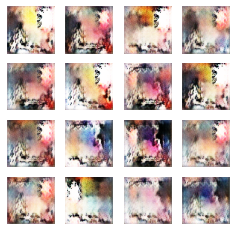

379/379 [==============================] - 61s 160ms/step - d_loss: -155.9931 - g_loss: 158.6196
Epoch 25/100
379/379 [==============================] - ETA: 0s - d_loss: -147.2250 - g_loss: -313.9097

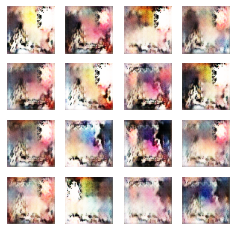

379/379 [==============================] - 61s 160ms/step - d_loss: -147.2250 - g_loss: -313.9097
Epoch 26/100
379/379 [==============================] - ETA: 0s - d_loss: -146.4850 - g_loss: -342.4832

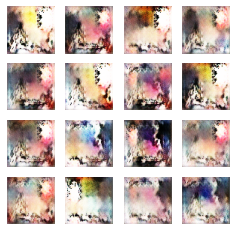

379/379 [==============================] - 61s 160ms/step - d_loss: -146.4850 - g_loss: -342.4832
Epoch 27/100
379/379 [==============================] - ETA: 0s - d_loss: -145.2012 - g_loss: -882.0002

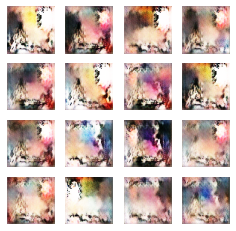

379/379 [==============================] - 61s 159ms/step - d_loss: -145.2012 - g_loss: -882.0002
Epoch 28/100
379/379 [==============================] - ETA: 0s - d_loss: -136.8804 - g_loss: -404.9632

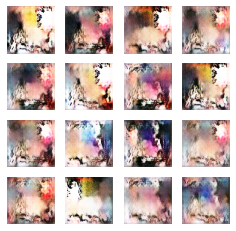

379/379 [==============================] - 61s 160ms/step - d_loss: -136.8804 - g_loss: -404.9632
Epoch 29/100
379/379 [==============================] - ETA: 0s - d_loss: -138.2604 - g_loss: -342.1552

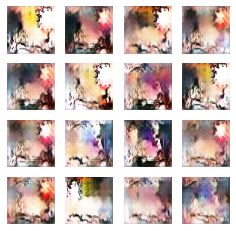

379/379 [==============================] - 61s 160ms/step - d_loss: -138.2604 - g_loss: -342.1552
Epoch 30/100
379/379 [==============================] - ETA: 0s - d_loss: -134.6067 - g_loss: -482.1546

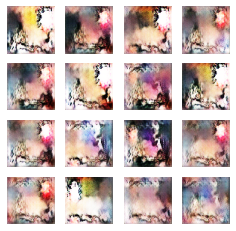

379/379 [==============================] - 61s 160ms/step - d_loss: -134.6067 - g_loss: -482.1546
Epoch 31/100
379/379 [==============================] - ETA: 0s - d_loss: -134.3822 - g_loss: -774.6527

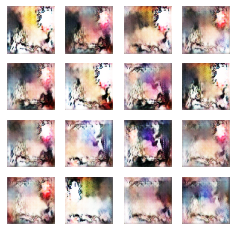

379/379 [==============================] - 61s 160ms/step - d_loss: -134.3822 - g_loss: -774.6527
Epoch 32/100
379/379 [==============================] - ETA: 0s - d_loss: -128.4367 - g_loss: -502.2915

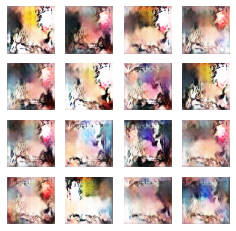

379/379 [==============================] - 61s 160ms/step - d_loss: -128.4367 - g_loss: -502.2915
Epoch 33/100
379/379 [==============================] - ETA: 0s - d_loss: -125.5858 - g_loss: 118.1589

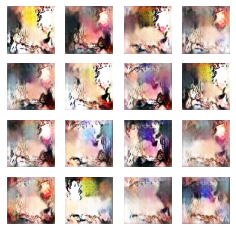

379/379 [==============================] - 61s 160ms/step - d_loss: -125.5858 - g_loss: 118.1589
Epoch 34/100
379/379 [==============================] - ETA: 0s - d_loss: -124.7894 - g_loss: -1119.8585

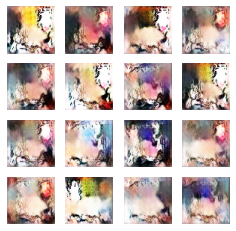

379/379 [==============================] - 61s 159ms/step - d_loss: -124.7894 - g_loss: -1119.8585
Epoch 35/100
379/379 [==============================] - ETA: 0s - d_loss: -123.0889 - g_loss: -265.4843

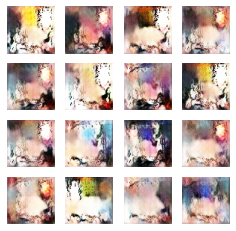

379/379 [==============================] - 61s 160ms/step - d_loss: -123.0889 - g_loss: -265.4843
Epoch 36/100
379/379 [==============================] - ETA: 0s - d_loss: -126.8899 - g_loss: -498.6029

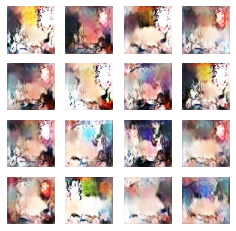

379/379 [==============================] - 61s 160ms/step - d_loss: -126.8899 - g_loss: -498.6029
Epoch 37/100
379/379 [==============================] - ETA: 0s - d_loss: -113.8888 - g_loss: 56.6647

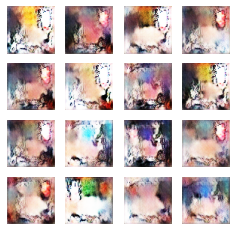

379/379 [==============================] - 61s 160ms/step - d_loss: -113.8888 - g_loss: 56.6647
Epoch 38/100
379/379 [==============================] - ETA: 0s - d_loss: -115.7210 - g_loss: 347.7167

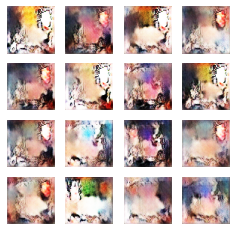

379/379 [==============================] - 61s 160ms/step - d_loss: -115.7210 - g_loss: 347.7167
Epoch 39/100
379/379 [==============================] - ETA: 0s - d_loss: -110.9138 - g_loss: 706.1428

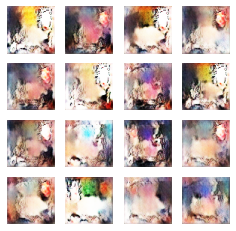

379/379 [==============================] - 61s 160ms/step - d_loss: -110.9138 - g_loss: 706.1428
Epoch 40/100
379/379 [==============================] - ETA: 0s - d_loss: -116.2449 - g_loss: 422.7111

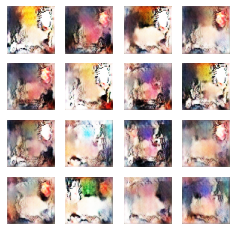

379/379 [==============================] - 61s 160ms/step - d_loss: -116.2449 - g_loss: 422.7111
Epoch 41/100
379/379 [==============================] - ETA: 0s - d_loss: -109.9083 - g_loss: 616.9618

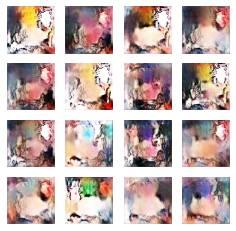

379/379 [==============================] - 61s 160ms/step - d_loss: -109.9083 - g_loss: 616.9618
Epoch 42/100
379/379 [==============================] - ETA: 0s - d_loss: -106.4995 - g_loss: 1250.1245

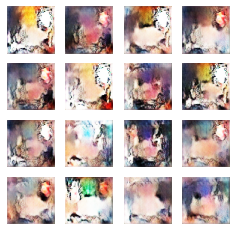

379/379 [==============================] - 61s 160ms/step - d_loss: -106.4995 - g_loss: 1250.1245
Epoch 43/100
379/379 [==============================] - ETA: 0s - d_loss: -103.7924 - g_loss: 1114.8544

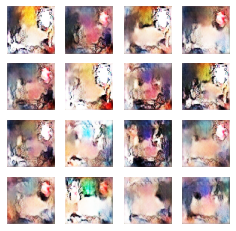

379/379 [==============================] - 61s 160ms/step - d_loss: -103.7924 - g_loss: 1114.8544
Epoch 44/100
379/379 [==============================] - ETA: 0s - d_loss: -100.9185 - g_loss: 820.3198

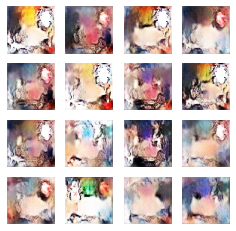

379/379 [==============================] - 61s 160ms/step - d_loss: -100.9185 - g_loss: 820.3198
Epoch 45/100
379/379 [==============================] - ETA: 0s - d_loss: -101.8479 - g_loss: 1438.2510

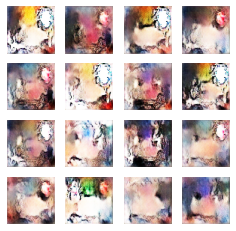

379/379 [==============================] - 61s 160ms/step - d_loss: -101.8479 - g_loss: 1438.2510
Epoch 46/100
379/379 [==============================] - ETA: 0s - d_loss: -90.8682 - g_loss: 994.8701

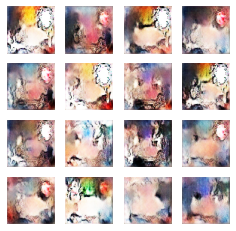

379/379 [==============================] - 61s 160ms/step - d_loss: -90.8682 - g_loss: 994.8701
Epoch 47/100
379/379 [==============================] - ETA: 0s - d_loss: -93.1442 - g_loss: 1345.4806

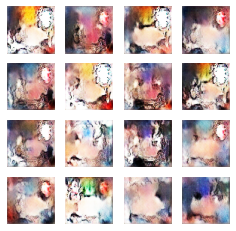

379/379 [==============================] - 61s 159ms/step - d_loss: -93.1442 - g_loss: 1345.4806
Epoch 48/100
379/379 [==============================] - ETA: 0s - d_loss: -93.7756 - g_loss: 426.7402

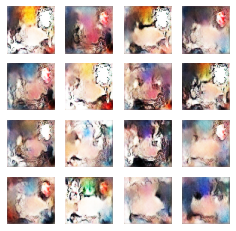

379/379 [==============================] - 61s 160ms/step - d_loss: -93.7756 - g_loss: 426.7402
Epoch 49/100
379/379 [==============================] - ETA: 0s - d_loss: -91.1496 - g_loss: 342.3893

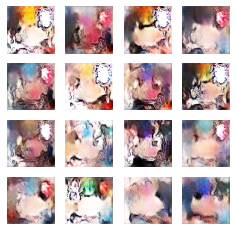

379/379 [==============================] - 61s 160ms/step - d_loss: -91.1496 - g_loss: 342.3893
Epoch 50/100
379/379 [==============================] - ETA: 0s - d_loss: -90.7596 - g_loss: 721.7839

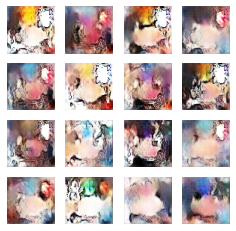

379/379 [==============================] - 61s 160ms/step - d_loss: -90.7596 - g_loss: 721.7839
Epoch 51/100
379/379 [==============================] - ETA: 0s - d_loss: -81.9108 - g_loss: 945.5269

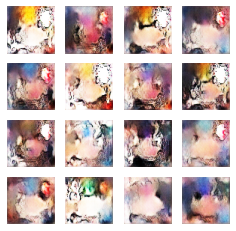

379/379 [==============================] - 61s 159ms/step - d_loss: -81.9108 - g_loss: 945.5269
Epoch 52/100
379/379 [==============================] - ETA: 0s - d_loss: -88.1299 - g_loss: 387.5591

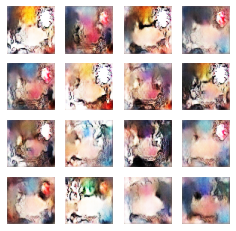

379/379 [==============================] - 61s 159ms/step - d_loss: -88.1299 - g_loss: 387.5591
Epoch 53/100
379/379 [==============================] - ETA: 0s - d_loss: -89.3723 - g_loss: 39.8279

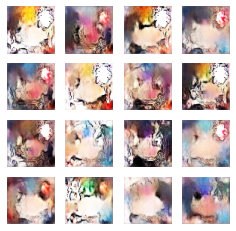

379/379 [==============================] - 61s 160ms/step - d_loss: -89.3723 - g_loss: 39.8279
Epoch 54/100
379/379 [==============================] - ETA: 0s - d_loss: -78.1329 - g_loss: 438.9183

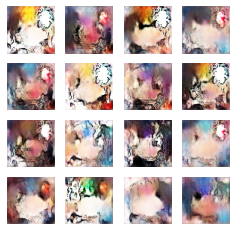

379/379 [==============================] - 61s 159ms/step - d_loss: -78.1329 - g_loss: 438.9183
Epoch 55/100
379/379 [==============================] - ETA: 0s - d_loss: -76.3606 - g_loss: 1347.0237

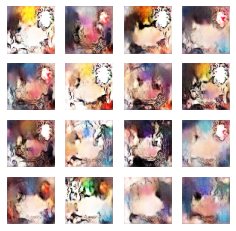

379/379 [==============================] - 61s 159ms/step - d_loss: -76.3606 - g_loss: 1347.0237
Epoch 56/100
379/379 [==============================] - ETA: 0s - d_loss: -73.1932 - g_loss: 925.9162

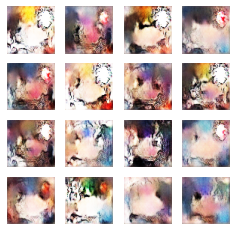

379/379 [==============================] - 61s 160ms/step - d_loss: -73.1932 - g_loss: 925.9162
Epoch 57/100
379/379 [==============================] - ETA: 0s - d_loss: -74.5172 - g_loss: -773.7646

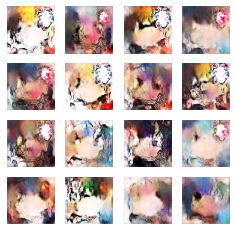

379/379 [==============================] - 61s 160ms/step - d_loss: -74.5172 - g_loss: -773.7646
Epoch 58/100
379/379 [==============================] - ETA: 0s - d_loss: -77.4759 - g_loss: 275.5440

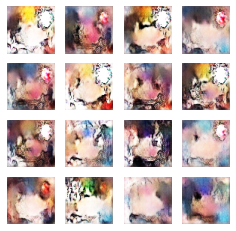

379/379 [==============================] - 61s 160ms/step - d_loss: -77.4759 - g_loss: 275.5440
Epoch 59/100
379/379 [==============================] - ETA: 0s - d_loss: -72.5492 - g_loss: -353.3996

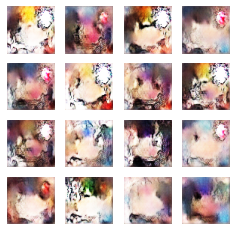

379/379 [==============================] - 61s 159ms/step - d_loss: -72.5492 - g_loss: -353.3996
Epoch 60/100
379/379 [==============================] - ETA: 0s - d_loss: -76.2274 - g_loss: -942.3134

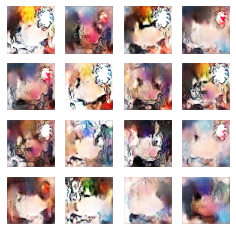

379/379 [==============================] - 61s 160ms/step - d_loss: -76.2274 - g_loss: -942.3134
Epoch 61/100
379/379 [==============================] - ETA: 0s - d_loss: -86.0750 - g_loss: -2930.3054

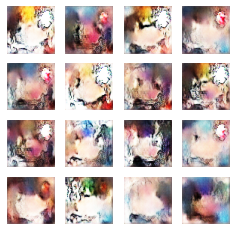

379/379 [==============================] - 61s 160ms/step - d_loss: -86.0750 - g_loss: -2930.3054
Epoch 62/100
379/379 [==============================] - ETA: 0s - d_loss: -78.7730 - g_loss: -3343.8550

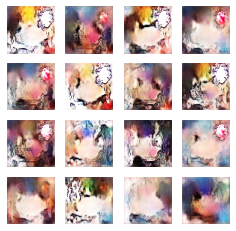

379/379 [==============================] - 61s 160ms/step - d_loss: -78.7730 - g_loss: -3343.8550
Epoch 63/100
379/379 [==============================] - ETA: 0s - d_loss: -82.2790 - g_loss: -4416.5483

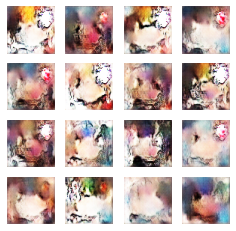

379/379 [==============================] - 61s 159ms/step - d_loss: -82.2790 - g_loss: -4416.5483
Epoch 64/100
379/379 [==============================] - ETA: 0s - d_loss: -69.4686 - g_loss: -2719.5671

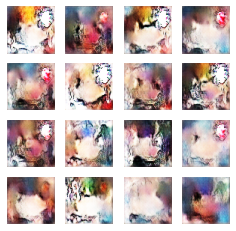

379/379 [==============================] - 61s 159ms/step - d_loss: -69.4686 - g_loss: -2719.5671
Epoch 65/100
379/379 [==============================] - ETA: 0s - d_loss: -74.5037 - g_loss: -2976.9285

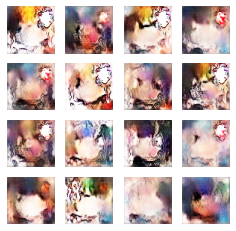

379/379 [==============================] - 61s 160ms/step - d_loss: -74.5037 - g_loss: -2976.9285
Epoch 66/100
379/379 [==============================] - ETA: 0s - d_loss: -87.1080 - g_loss: -4678.6934

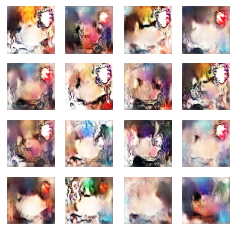

379/379 [==============================] - 61s 159ms/step - d_loss: -87.1080 - g_loss: -4678.6934
Epoch 67/100
379/379 [==============================] - ETA: 0s - d_loss: -78.2384 - g_loss: -3225.1257

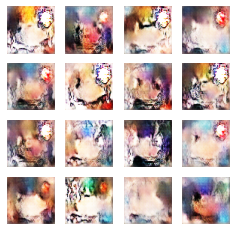

379/379 [==============================] - 61s 159ms/step - d_loss: -78.2384 - g_loss: -3225.1257
Epoch 68/100
379/379 [==============================] - ETA: 0s - d_loss: -73.7354 - g_loss: 483.8074

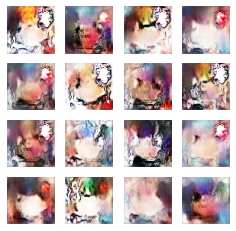

379/379 [==============================] - 61s 159ms/step - d_loss: -73.7354 - g_loss: 483.8074
Epoch 69/100
379/379 [==============================] - ETA: 0s - d_loss: -79.9097 - g_loss: -4558.8320

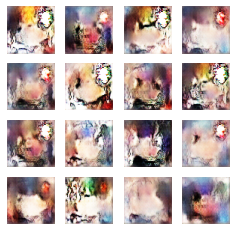

379/379 [==============================] - 61s 160ms/step - d_loss: -79.9097 - g_loss: -4558.8320
Epoch 70/100
379/379 [==============================] - ETA: 0s - d_loss: -75.3957 - g_loss: 753.8068

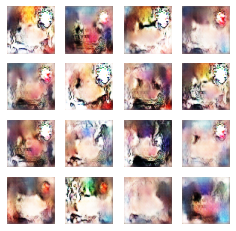

379/379 [==============================] - 61s 159ms/step - d_loss: -75.3957 - g_loss: 753.8068
Epoch 71/100
379/379 [==============================] - ETA: 0s - d_loss: -96.7593 - g_loss: -252.3426

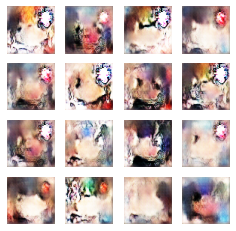

379/379 [==============================] - 61s 159ms/step - d_loss: -96.7593 - g_loss: -252.3426
Epoch 72/100
379/379 [==============================] - ETA: 0s - d_loss: -82.9596 - g_loss: 4826.0610

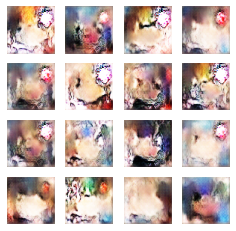

379/379 [==============================] - 61s 159ms/step - d_loss: -82.9596 - g_loss: 4826.0610
Epoch 73/100
379/379 [==============================] - ETA: 0s - d_loss: -70.3446 - g_loss: 2999.4805

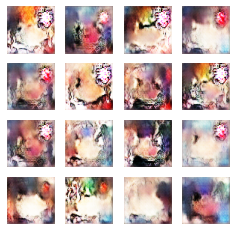

379/379 [==============================] - 61s 160ms/step - d_loss: -70.3446 - g_loss: 2999.4805
Epoch 74/100
379/379 [==============================] - ETA: 0s - d_loss: -63.0060 - g_loss: -4569.3965

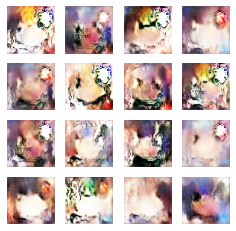

379/379 [==============================] - 61s 159ms/step - d_loss: -63.0060 - g_loss: -4569.3965
Epoch 75/100
379/379 [==============================] - ETA: 0s - d_loss: -62.5445 - g_loss: -6667.1313

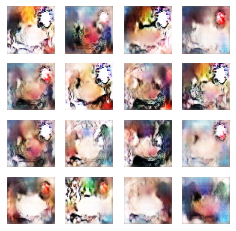

379/379 [==============================] - 61s 159ms/step - d_loss: -62.5445 - g_loss: -6667.1313
Epoch 76/100
379/379 [==============================] - ETA: 0s - d_loss: -70.4557 - g_loss: -6388.6089

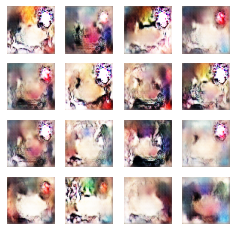

379/379 [==============================] - 61s 159ms/step - d_loss: -70.4557 - g_loss: -6388.6089
Epoch 77/100
379/379 [==============================] - ETA: 0s - d_loss: -54.7931 - g_loss: -4755.7202

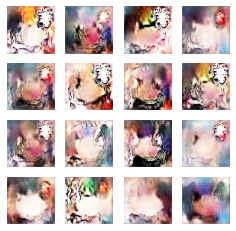

379/379 [==============================] - 61s 160ms/step - d_loss: -54.7931 - g_loss: -4755.7202
Epoch 78/100
379/379 [==============================] - ETA: 0s - d_loss: -55.3926 - g_loss: -2222.6338

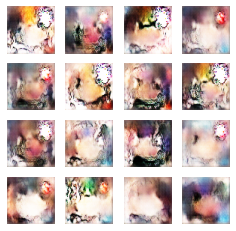

379/379 [==============================] - 61s 159ms/step - d_loss: -55.3926 - g_loss: -2222.6338
Epoch 79/100
379/379 [==============================] - ETA: 0s - d_loss: -80.4049 - g_loss: -1613.6696

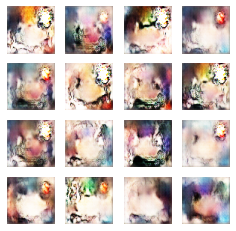

379/379 [==============================] - 61s 159ms/step - d_loss: -80.4049 - g_loss: -1613.6696
Epoch 80/100
379/379 [==============================] - ETA: 0s - d_loss: -66.4166 - g_loss: -15419.0459

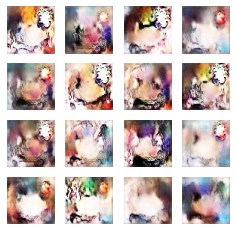

379/379 [==============================] - 61s 159ms/step - d_loss: -66.4166 - g_loss: -15419.0459
Epoch 81/100
379/379 [==============================] - ETA: 0s - d_loss: -63.0884 - g_loss: -15658.9316

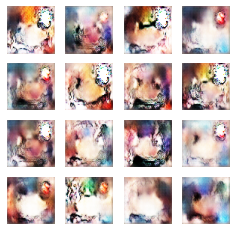

379/379 [==============================] - 61s 160ms/step - d_loss: -63.0884 - g_loss: -15658.9316
Epoch 82/100
379/379 [==============================] - ETA: 0s - d_loss: -49.9142 - g_loss: -12650.8945

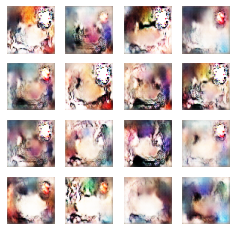

379/379 [==============================] - 61s 159ms/step - d_loss: -49.9142 - g_loss: -12650.8945
Epoch 83/100
379/379 [==============================] - ETA: 0s - d_loss: -49.2314 - g_loss: -9417.9736

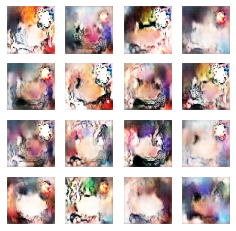

379/379 [==============================] - 61s 160ms/step - d_loss: -49.2314 - g_loss: -9417.9736
Epoch 84/100
379/379 [==============================] - ETA: 0s - d_loss: -52.0797 - g_loss: -11398.6514

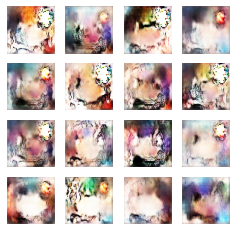

379/379 [==============================] - 61s 159ms/step - d_loss: -52.0797 - g_loss: -11398.6514
Epoch 85/100
379/379 [==============================] - ETA: 0s - d_loss: -60.5927 - g_loss: -11446.5977

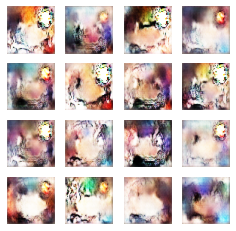

379/379 [==============================] - 61s 160ms/step - d_loss: -60.5927 - g_loss: -11446.5977
Epoch 86/100
379/379 [==============================] - ETA: 0s - d_loss: -53.8974 - g_loss: -10710.5342

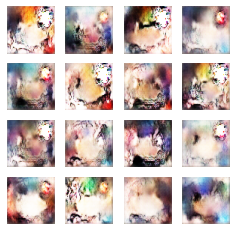

379/379 [==============================] - 61s 159ms/step - d_loss: -53.8974 - g_loss: -10710.5342
Epoch 87/100
379/379 [==============================] - ETA: 0s - d_loss: -60.7115 - g_loss: -9416.6455

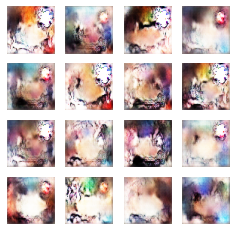

379/379 [==============================] - 61s 159ms/step - d_loss: -60.7115 - g_loss: -9416.6455
Epoch 88/100
379/379 [==============================] - ETA: 0s - d_loss: -56.3729 - g_loss: -11308.7188

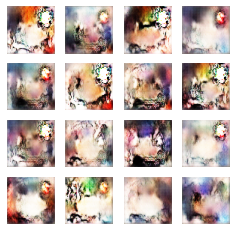

379/379 [==============================] - 61s 159ms/step - d_loss: -56.3729 - g_loss: -11308.7188
Epoch 89/100
379/379 [==============================] - ETA: 0s - d_loss: -45.4673 - g_loss: 551.1620

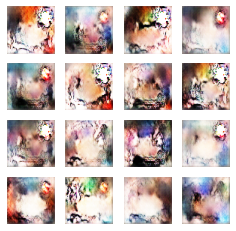

379/379 [==============================] - 61s 160ms/step - d_loss: -45.4673 - g_loss: 551.1620
Epoch 90/100
379/379 [==============================] - ETA: 0s - d_loss: -51.4843 - g_loss: 970.5566

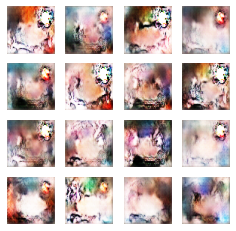

379/379 [==============================] - 61s 160ms/step - d_loss: -51.4843 - g_loss: 970.5566
Epoch 91/100
379/379 [==============================] - ETA: 0s - d_loss: -61.0553 - g_loss: -9540.5381

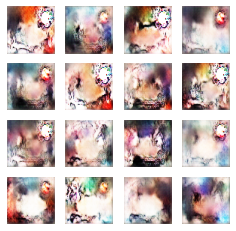

379/379 [==============================] - 61s 159ms/step - d_loss: -61.0553 - g_loss: -9540.5381
Epoch 92/100
379/379 [==============================] - ETA: 0s - d_loss: -65.0632 - g_loss: 3518.7932

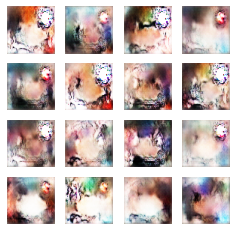

379/379 [==============================] - 61s 159ms/step - d_loss: -65.0632 - g_loss: 3518.7932
Epoch 93/100
379/379 [==============================] - ETA: 0s - d_loss: -69.2683 - g_loss: -1299.6447

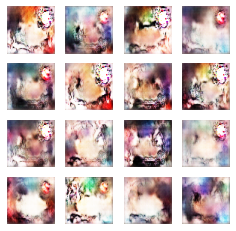

379/379 [==============================] - 61s 160ms/step - d_loss: -69.2683 - g_loss: -1299.6447
Epoch 94/100
379/379 [==============================] - ETA: 0s - d_loss: -69.8261 - g_loss: -730.4309

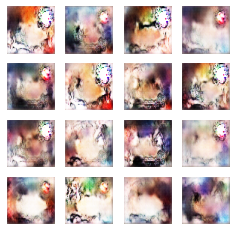

379/379 [==============================] - 61s 159ms/step - d_loss: -69.8261 - g_loss: -730.4309
Epoch 95/100
379/379 [==============================] - ETA: 0s - d_loss: -67.3360 - g_loss: -420.9892

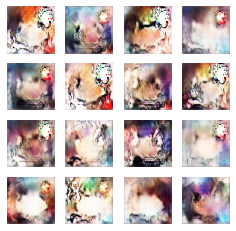

379/379 [==============================] - 61s 159ms/step - d_loss: -67.3360 - g_loss: -420.9892
Epoch 96/100
379/379 [==============================] - ETA: 0s - d_loss: -102.8874 - g_loss: -3126.6553

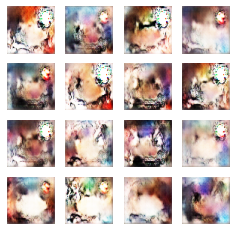

379/379 [==============================] - 61s 159ms/step - d_loss: -102.8874 - g_loss: -3126.6553
Epoch 97/100
379/379 [==============================] - ETA: 0s - d_loss: -68.5097 - g_loss: -6952.6060

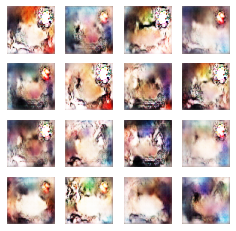

379/379 [==============================] - 61s 160ms/step - d_loss: -68.5097 - g_loss: -6952.6060
Epoch 98/100
379/379 [==============================] - ETA: 0s - d_loss: -76.5509 - g_loss: -5927.3066

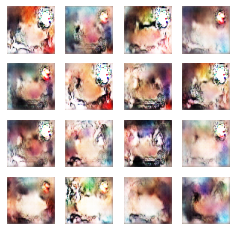

379/379 [==============================] - 61s 159ms/step - d_loss: -76.5509 - g_loss: -5927.3066
Epoch 99/100
379/379 [==============================] - ETA: 0s - d_loss: -65.7427 - g_loss: -5808.0278

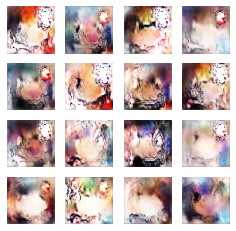

379/379 [==============================] - 61s 159ms/step - d_loss: -65.7427 - g_loss: -5808.0278
Epoch 100/100
379/379 [==============================] - ETA: 0s - d_loss: -81.4553 - g_loss: -354.4313

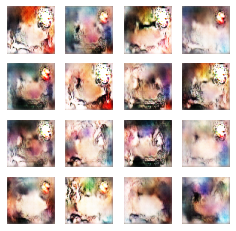

379/379 [==============================] - 61s 159ms/step - d_loss: -81.4553 - g_loss: -354.4313


In [ ]:
NUM_EPOCHS = 100 # number of epochs
wgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])